# 03 — Evaluasi dan Perbandingan ResNet50 versus Swin Transformer-Tiny

by: Muhammad Bondan Vitto Ramadhan

NIM : 2702831190

**Proyek:** Klasifikasi 37 ras kucing dan anjing pada Oxford-IIIT Pet Dataset  
**Tahap:** Evaluasi final pada custom test set 15%  
**Model:** ResNet50 dan Swin Transformer-Tiny

Notebook ini hanya menggunakan checkpoint terbaik yang dipilih berdasarkan
validation macro-F1 pada notebook 02. Data test digunakan untuk evaluasi final
dan tidak digunakan untuk memilih epoch, learning rate, augmentasi, maupun
arsitektur.

Luaran utama:

1. Accuracy, macro precision, macro recall, dan macro F1-score.
2. Precision, recall, dan F1-score setiap kelas.
3. Confusion matrix absolut dan ternormalisasi.
4. Pasangan ras yang paling sering tertukar.
5. Contoh prediksi benar dan salah.
6. Grad-CAM ResNet50 dan Swin Transformer-Tiny.
7. Waktu training, jumlah parameter, ukuran checkpoint, dan waktu inferensi.
8. Tabel perbandingan final kedua model.

## 1. Preparation

In [1]:
import gc
import json
import os
import platform
import random
import re
import shutil
import sys
import tarfile
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from PIL import Image, ImageOps
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    precision_recall_fscore_support,
)
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.models import resnet50, swin_t
from tqdm.auto import tqdm

sns.set_theme(style="whitegrid", context="notebook")
pd.set_option("display.max_columns", 60)
pd.set_option("display.max_colwidth", 120)

SEED = 42


def set_seed(seed=SEED):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)


set_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

print("Python      :", sys.version.split()[0])
print("PyTorch     :", torch.__version__)
print("torchvision :", torchvision.__version__)
print("scikit-learn:", sklearn.__version__)

Python      : 3.13.15
PyTorch     : 2.11.0+cu128
torchvision : 0.26.0+cu128
scikit-learn: 1.6.1


In [2]:
from google.colab import drive

drive.mount("/content/drive", force_remount=False)

Mounted at /content/drive


In [3]:
PROJECT_DIR = Path(
    "/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/"
    "AoL1_ComputerVision"
)

DATA_DIR = PROJECT_DIR / "data"
RAW_DIR = DATA_DIR / "raw"
DRIVE_DATASET_DIR = DATA_DIR / "oxford_iiit_pet"
METADATA_DIR = DATA_DIR / "metadata"

OUTPUT_DIR = PROJECT_DIR / "outputs"
CHECKPOINT_DIR = OUTPUT_DIR / "checkpoints"
HISTORY_DIR = OUTPUT_DIR / "histories"
FIGURE_DIR = OUTPUT_DIR / "figures"
METRIC_DIR = OUTPUT_DIR / "metrics"
PREDICTION_DIR = OUTPUT_DIR / "predictions"

for folder in [
    RAW_DIR,
    METADATA_DIR,
    CHECKPOINT_DIR,
    HISTORY_DIR,
    FIGURE_DIR,
    METRIC_DIR,
    PREDICTION_DIR,
]:
    folder.mkdir(parents=True, exist_ok=True)

print("Project      :", PROJECT_DIR)
print("Checkpoints  :", CHECKPOINT_DIR)
print("Metrics      :", METRIC_DIR)
print("Predictions  :", PREDICTION_DIR)

Project      : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision
Checkpoints  : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/checkpoints
Metrics      : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics
Predictions  : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/predictions


In [4]:
if not torch.cuda.is_available():
    raise RuntimeError(
        "CUDA tidak tersedia. Aktifkan GPU agar evaluasi dan pengukuran "
        "waktu inferensi konsisten dengan proses training."
    )

device = torch.device("cuda")
AMP_ENABLED = True

ENVIRONMENT = {
    "python_version": sys.version.split()[0],
    "platform": platform.platform(),
    "pytorch_version": torch.__version__,
    "torchvision_version": torchvision.__version__,
    "scikit_learn_version": sklearn.__version__,
    "cuda_version": torch.version.cuda,
    "cudnn_version": torch.backends.cudnn.version(),
    "gpu_name": torch.cuda.get_device_name(0),
    "gpu_total_memory_gb": round(
        torch.cuda.get_device_properties(0).total_memory / 1024**3,
        3,
    ),
}

display(pd.Series(ENVIRONMENT, name="value").to_frame())

environment_path = METRIC_DIR / "evaluation_environment.json"
with environment_path.open("w", encoding="utf-8") as file_obj:
    json.dump(ENVIRONMENT, file_obj, indent=2, ensure_ascii=False)

,value
python_version,3.13.15
platform,Linux-6.6.122+-x86_64-with-glibc2.39
pytorch_version,2.11.0+cu128
torchvision_version,0.26.0+cu128
scikit_learn_version,1.6.1
cuda_version,12.8
cudnn_version,91900
gpu_name,Tesla T4
gpu_total_memory_gb,14.563


In [ ]:
# from pathlib import Path

# PROJECT_DIR = Path("/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision")
# #/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision
# RAW_DIR = PROJECT_DIR / "data" / "raw"
# OUTPUT_DIR = PROJECT_DIR / "outputs"
# CHECKPOINT_DIR = OUTPUT_DIR / "checkpoints"
# HISTORY_DIR = OUTPUT_DIR / "histories"
# FIGURE_DIR = OUTPUT_DIR / "figures"
# METRIC_DIR = OUTPUT_DIR / "metrics"

# for folder in [
#     RAW_DIR,
#     CHECKPOINT_DIR,
#     HISTORY_DIR,
#     FIGURE_DIR,
#     METRIC_DIR,
# ]:
#     folder.mkdir(parents=True, exist_ok=True)

# print(PROJECT_DIR)

/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision


## 2. Menyiapkan dataset pada local runtime

In [5]:
LOCAL_ROOT = Path("/content/oxford_iiit_pet")
LOCAL_IMAGES_DIR = LOCAL_ROOT / "images"
LOCAL_ANNOTATIONS_DIR = LOCAL_ROOT / "annotations"
IMAGES_ARCHIVE = RAW_DIR / "images.tar.gz"
ANNOTATIONS_ARCHIVE = RAW_DIR / "annotations.tar.gz"


def safe_extract_tar(archive_path, destination):
    '''Ekstrak TAR dengan pemeriksaan path traversal dan symbolic link.'''
    archive_path = Path(archive_path)
    destination = Path(destination)
    destination.mkdir(parents=True, exist_ok=True)
    destination_resolved = destination.resolve()

    with tarfile.open(archive_path, mode="r:gz") as archive:
        members = archive.getmembers()
        for member in members:
            target = (destination / member.name).resolve()
            if (
                target != destination_resolved
                and destination_resolved not in target.parents
            ):
                raise RuntimeError(f"Path tidak aman: {member.name}")
            if member.issym() or member.islnk():
                raise RuntimeError(f"Link tidak diizinkan: {member.name}")

        try:
            archive.extractall(destination, members=members, filter="data")
        except TypeError:
            archive.extractall(destination, members=members)


def local_images_complete():
    return (
        LOCAL_IMAGES_DIR.exists()
        and len(list(LOCAL_IMAGES_DIR.glob("*.jpg"))) >= 7_349
    )


if local_images_complete():
    print("Dataset lokal sudah lengkap; ekstraksi dilewati.")
elif IMAGES_ARCHIVE.exists():
    local_archive = Path("/content/images.tar.gz")
    print("Menyalin arsip gambar ke local runtime...")
    shutil.copy2(IMAGES_ARCHIVE, local_archive)
    print("Mengekstrak gambar...")
    safe_extract_tar(local_archive, LOCAL_ROOT)
elif (DRIVE_DATASET_DIR / "images").exists():
    print("Menyalin folder gambar dari Drive...")
    shutil.copytree(
        DRIVE_DATASET_DIR / "images",
        LOCAL_IMAGES_DIR,
        dirs_exist_ok=True,
    )
else:
    raise FileNotFoundError("Dataset Oxford-IIIT Pet tidak ditemukan.")

local_image_count = len(list(LOCAL_IMAGES_DIR.glob("*.jpg")))
print("Jumlah file JPG lokal:", f"{local_image_count:,}")
assert local_image_count >= 7_349

Menyalin arsip gambar ke local runtime...
Mengekstrak gambar...
Jumlah file JPG lokal: 7,390


## 3. Memastikan metadata split tersedia

Cell berikut membaca metadata notebook 01/02. Jika keempat file utama tidak
tersedia, metadata dibuat ulang dari anotasi resmi menggunakan algoritma yang
sama: pooled official split, stratified 70/15/15, dan random seed 42. Dengan
demikian, test set tetap identik dengan split yang digunakan notebook 02.

In [6]:
train_csv_path = METADATA_DIR / "train_split.csv"
val_csv_path = METADATA_DIR / "val_split.csv"
test_csv_path = METADATA_DIR / "test_split.csv"
class_map_path = METADATA_DIR / "class_map.json"

required_metadata_files = [
    train_csv_path,
    val_csv_path,
    test_csv_path,
    class_map_path,
]


def parse_annotation_file(file_path, official_split):
    species_map = {1: "Cat", 2: "Dog"}
    records = []

    with Path(file_path).open("r", encoding="utf-8") as file_obj:
        for line_number, line in enumerate(file_obj, start=1):
            line = line.strip()
            if not line or line.startswith("#"):
                continue

            parts = line.split()
            if len(parts) != 4:
                raise ValueError(
                    f"Format anotasi tidak valid pada baris {line_number}: {line}"
                )

            image_name, class_id, species_id, breed_id = parts
            class_id = int(class_id)
            species_id = int(species_id)
            breed_id = int(breed_id)

            records.append(
                {
                    "image_name": image_name,
                    "file_name": f"{image_name}.jpg",
                    "class_id": class_id,
                    "class_idx": class_id - 1,
                    "class_name": re.sub(r"_\d+$", "", image_name),
                    "species_id": species_id,
                    "species": species_map[species_id],
                    "breed_id": breed_id,
                    "official_split": official_split,
                }
            )

    return pd.DataFrame(records)


if not all(path.exists() for path in required_metadata_files):
    print("Metadata belum lengkap; membuat ulang metadata split...")

    annotation_candidates = [
        DRIVE_DATASET_DIR / "annotations",
        LOCAL_ANNOTATIONS_DIR,
    ]
    annotation_dir = None

    for candidate in annotation_candidates:
        if (
            (candidate / "trainval.txt").exists()
            and (candidate / "test.txt").exists()
        ):
            annotation_dir = candidate
            break

    if annotation_dir is None:
        if not ANNOTATIONS_ARCHIVE.exists():
            raise FileNotFoundError(
                "Metadata dan annotations.tar.gz sama-sama tidak tersedia."
            )
        safe_extract_tar(ANNOTATIONS_ARCHIVE, LOCAL_ROOT)
        annotation_dir = LOCAL_ANNOTATIONS_DIR

    official_trainval_df = parse_annotation_file(
        annotation_dir / "trainval.txt",
        "trainval",
    )
    official_test_df = parse_annotation_file(
        annotation_dir / "test.txt",
        "test",
    )
    full_df = pd.concat(
        [official_trainval_df, official_test_df],
        ignore_index=True,
    )

    regenerated_train_df, temporary_df = train_test_split(
        full_df,
        test_size=0.30,
        random_state=SEED,
        stratify=full_df["class_idx"],
    )
    regenerated_val_df, regenerated_test_df = train_test_split(
        temporary_df,
        test_size=0.50,
        random_state=SEED,
        stratify=temporary_df["class_idx"],
    )

    split_frames = [
        (regenerated_train_df, "train"),
        (regenerated_val_df, "validation"),
        (regenerated_test_df, "test"),
    ]
    for current_df, split_name in split_frames:
        current_df["split"] = split_name

    sort_columns = ["class_idx", "image_name"]
    regenerated_train_df = regenerated_train_df.sort_values(
        sort_columns
    ).reset_index(drop=True)
    regenerated_val_df = regenerated_val_df.sort_values(
        sort_columns
    ).reset_index(drop=True)
    regenerated_test_df = regenerated_test_df.sort_values(
        sort_columns
    ).reset_index(drop=True)

    save_columns = [
        "image_name",
        "file_name",
        "class_id",
        "class_idx",
        "class_name",
        "species_id",
        "species",
        "breed_id",
        "official_split",
        "split",
    ]
    regenerated_train_df[save_columns].to_csv(train_csv_path, index=False)
    regenerated_val_df[save_columns].to_csv(val_csv_path, index=False)
    regenerated_test_df[save_columns].to_csv(test_csv_path, index=False)

    class_rows = (
        full_df.sort_values("class_idx")
        .drop_duplicates("class_idx")
    )
    regenerated_class_map = {
        str(int(row.class_idx)): {
            "class_id": int(row.class_id),
            "class_name": row.class_name,
            "display_name": row.class_name.replace("_", " "),
            "species": row.species,
        }
        for row in class_rows.itertuples(index=False)
    }
    with class_map_path.open("w", encoding="utf-8") as file_obj:
        json.dump(
            regenerated_class_map,
            file_obj,
            indent=2,
            ensure_ascii=False,
        )

    print("Metadata berhasil dibuat ulang.")
else:
    print("Metadata lengkap sudah tersedia.")

assert all(path.exists() for path in required_metadata_files)

Metadata lengkap sudah tersedia.


Membaca dan memvalidasi metadata split

In [7]:
train_df = pd.read_csv(train_csv_path)
val_df = pd.read_csv(val_csv_path)
test_df = pd.read_csv(test_csv_path)

with class_map_path.open("r", encoding="utf-8") as file_obj:
    class_map = json.load(file_obj)

NUM_CLASSES = 37
class_names = [
    class_map[str(index)]["class_name"]
    for index in range(NUM_CLASSES)
]
display_names = [name.replace("_", " ") for name in class_names]

assert len(train_df) == 5_144
assert len(val_df) == 1_102
assert len(test_df) == 1_103
assert test_df["class_idx"].nunique() == NUM_CLASSES
assert test_df["image_name"].is_unique

train_names = set(train_df["image_name"])
val_names = set(val_df["image_name"])
test_names = set(test_df["image_name"])

assert train_names.isdisjoint(val_names)
assert train_names.isdisjoint(test_names)
assert val_names.isdisjoint(test_names)

missing_test_images = [
    file_name
    for file_name in test_df["file_name"]
    if not (LOCAL_IMAGES_DIR / file_name).exists()
]
assert not missing_test_images, f"Gambar test hilang: {missing_test_images[:10]}"

split_summary = pd.DataFrame(
    {
        "split": ["train", "validation", "test"],
        "images": [len(train_df), len(val_df), len(test_df)],
        "classes": [
            train_df["class_idx"].nunique(),
            val_df["class_idx"].nunique(),
            test_df["class_idx"].nunique(),
        ],
    }
)
display(split_summary)
print("Test set valid dan belum digunakan untuk pemilihan model.")

,split,images,classes
0,train,5144,37
1,validation,1102,37
2,test,1103,37


Test set valid dan belum digunakan untuk pemilihan model.


## 4. Memeriksa checkpoint dan history training

In [8]:
MODEL_DISPLAY_NAMES = {
    "resnet50": "ResNet50",
    "swin_t": "Swin Transformer-Tiny",
}

BEST_CHECKPOINTS = {
    "resnet50": CHECKPOINT_DIR / "resnet50_best.pth",
    "swin_t": CHECKPOINT_DIR / "swin_t_best.pth",
}

checkpoint_status = pd.DataFrame(
    [
        {
            "model_key": model_name,
            "model": MODEL_DISPLAY_NAMES[model_name],
            "file": path.name,
            "exists": path.exists(),
            "size_mb": (
                round(path.stat().st_size / 1024**2, 3)
                if path.exists()
                else np.nan
            ),
        }
        for model_name, path in BEST_CHECKPOINTS.items()
    ]
)

display(checkpoint_status)
assert checkpoint_status["exists"].all(), (
    "Checkpoint terbaik belum lengkap. Selesaikan notebook 02 terlebih dahulu."
)

,model_key,model,file,exists,size_mb
0,resnet50,ResNet50,resnet50_best.pth,True,90.274
1,swin_t,Swin Transformer-Tiny,swin_t_best.pth,True,105.373


In [9]:
history_tables = {}

for model_name in MODEL_DISPLAY_NAMES:
    history_path = HISTORY_DIR / f"{model_name}_history.csv"
    if history_path.exists():
        history_tables[model_name] = pd.read_csv(history_path)
        print(
            f"{MODEL_DISPLAY_NAMES[model_name]}: "
            f"{len(history_tables[model_name])} epoch"
        )
    else:
        print(f"History {model_name} tidak ditemukan.")

ResNet50: 12 epoch
Swin Transformer-Tiny: 6 epoch


## 5. Dataset dan DataLoader test

In [10]:
IMAGE_SIZE = 224
RESIZE_SIZE = 256
BATCH_SIZE = 32
NUM_WORKERS = 2

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

eval_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, antialias=True),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=IMAGENET_MEAN,
            std=IMAGENET_STD,
        ),
    ]
)

display_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, antialias=True),
        transforms.CenterCrop(IMAGE_SIZE),
    ]
)


class OxfordPetTestDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform):
        self.dataframe = dataframe.reset_index(drop=True).copy()
        self.image_dir = Path(image_dir)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]
        image_path = self.image_dir / row["file_name"]

        with Image.open(image_path) as image:
            image = ImageOps.exif_transpose(image).convert("RGB")

        image_tensor = self.transform(image)
        label = int(row["class_idx"])
        return image_tensor, label, index


test_dataset = OxfordPetTestDataset(
    test_df,
    LOCAL_IMAGES_DIR,
    eval_transform,
)

loader_kwargs = {
    "batch_size": BATCH_SIZE,
    "shuffle": False,
    "num_workers": NUM_WORKERS,
    "pin_memory": True,
    "drop_last": False,
}

if NUM_WORKERS > 0:
    loader_kwargs["persistent_workers"] = True
    loader_kwargs["prefetch_factor"] = 2

test_loader = DataLoader(test_dataset, **loader_kwargs)

sample_images, sample_labels, sample_indices = next(iter(test_loader))
print("Test images :", len(test_dataset))
print("Test batches:", len(test_loader))
print("Batch shape :", tuple(sample_images.shape))

assert sample_images.shape[1:] == (3, IMAGE_SIZE, IMAGE_SIZE)
del sample_images, sample_labels, sample_indices

Test images : 1103
Test batches: 35
Batch shape : (32, 3, 224, 224)


## 6. Load the Model

In [11]:
def build_model(model_name, num_classes=NUM_CLASSES):
    if model_name == "resnet50":
        model = resnet50(weights=None)
        input_features = model.fc.in_features
        model.fc = nn.Linear(input_features, num_classes)
    elif model_name == "swin_t":
        model = swin_t(weights=None)
        input_features = model.head.in_features
        model.head = nn.Linear(input_features, num_classes)
    else:
        raise ValueError(f"Model tidak dikenali: {model_name}")
    return model


def count_parameters(model):
    total = sum(parameter.numel() for parameter in model.parameters())
    trainable = sum(
        parameter.numel()
        for parameter in model.parameters()
        if parameter.requires_grad
    )
    return total, trainable


def load_best_model(model_name):
    checkpoint_path = BEST_CHECKPOINTS[model_name]
    checkpoint = torch.load(
        checkpoint_path,
        map_location="cpu",
        weights_only=False,
    )

    model = build_model(model_name)
    state_dict = checkpoint.get("model_state_dict", checkpoint)
    model.load_state_dict(state_dict, strict=True)
    model = model.to(device)
    model.eval()

    if "class_names" in checkpoint:
        assert checkpoint["class_names"] == class_names, (
            f"Urutan kelas checkpoint {model_name} berbeda dari metadata."
        )

    return model, checkpoint

## 7. Fungsi evaluasi dan pengukuran waktu inferensi

In [12]:
def benchmark_single_image_latency(
    model,
    dataset,
    number_of_images=200,
    warmup_runs=20,
):
    '''Ukur forward-pass batch size 1; I/O dan preprocessing tidak dihitung.'''
    number_of_images = min(number_of_images, len(dataset))
    benchmark_indices = np.linspace(
        0,
        len(dataset) - 1,
        number_of_images,
        dtype=int,
    )

    warmup_image = dataset[int(benchmark_indices[0])][0].unsqueeze(0).to(device)
    with torch.inference_mode():
        for _ in range(warmup_runs):
            with torch.autocast(
                device_type="cuda",
                dtype=torch.float16,
                enabled=AMP_ENABLED,
            ):
                _ = model(warmup_image)
    torch.cuda.synchronize()
    del warmup_image

    latency_ms = []

    with torch.inference_mode():
        for index in tqdm(
            benchmark_indices,
            desc="Benchmark latency",
            leave=False,
        ):
            image_tensor = dataset[int(index)][0].unsqueeze(0).to(device)
            torch.cuda.synchronize()

            start_time = time.perf_counter()
            with torch.autocast(
                device_type="cuda",
                dtype=torch.float16,
                enabled=AMP_ENABLED,
            ):
                _ = model(image_tensor)
            torch.cuda.synchronize()
            elapsed_ms = (time.perf_counter() - start_time) * 1000
            latency_ms.append(elapsed_ms)

            del image_tensor

    latency_ms = np.asarray(latency_ms, dtype=float)

    return {
        "latency_sample_size": int(len(latency_ms)),
        "inference_mean_ms_per_image": float(latency_ms.mean()),
        "inference_median_ms_per_image": float(np.median(latency_ms)),
        "inference_p95_ms_per_image": float(np.percentile(latency_ms, 95)),
        "inference_min_ms_per_image": float(latency_ms.min()),
        "inference_max_ms_per_image": float(latency_ms.max()),
    }

In [13]:
def evaluate_model(model_name, model, checkpoint):
    criterion = nn.CrossEntropyLoss()

    all_targets = []
    all_predictions = []
    all_confidences = []
    all_second_predictions = []
    all_second_confidences = []
    all_indices = []
    running_loss = 0.0

    torch.cuda.synchronize()
    evaluation_start = time.perf_counter()

    with torch.inference_mode():
        for images, targets, indices in tqdm(
            test_loader,
            desc=f"Evaluate {model_name}",
        ):
            images = images.to(device, non_blocking=True)
            targets = targets.to(device, non_blocking=True)

            with torch.autocast(
                device_type="cuda",
                dtype=torch.float16,
                enabled=AMP_ENABLED,
            ):
                logits = model(images)
                loss = criterion(logits, targets)

            probabilities = torch.softmax(logits.float(), dim=1)
            top_probabilities, top_indices = probabilities.topk(k=2, dim=1)

            running_loss += loss.item() * targets.size(0)
            all_targets.extend(targets.cpu().tolist())
            all_predictions.extend(top_indices[:, 0].cpu().tolist())
            all_confidences.extend(top_probabilities[:, 0].cpu().tolist())
            all_second_predictions.extend(top_indices[:, 1].cpu().tolist())
            all_second_confidences.extend(top_probabilities[:, 1].cpu().tolist())
            all_indices.extend(indices.tolist())

    torch.cuda.synchronize()
    evaluation_seconds = time.perf_counter() - evaluation_start

    targets_array = np.asarray(all_targets)
    predictions_array = np.asarray(all_predictions)

    macro_precision, macro_recall, macro_f1, _ = (
        precision_recall_fscore_support(
            targets_array,
            predictions_array,
            average="macro",
            zero_division=0,
        )
    )
    weighted_precision, weighted_recall, weighted_f1, _ = (
        precision_recall_fscore_support(
            targets_array,
            predictions_array,
            average="weighted",
            zero_division=0,
        )
    )
    per_class_precision, per_class_recall, per_class_f1, per_class_support = (
        precision_recall_fscore_support(
            targets_array,
            predictions_array,
            labels=np.arange(NUM_CLASSES),
            average=None,
            zero_division=0,
        )
    )

    matrix = confusion_matrix(
        targets_array,
        predictions_array,
        labels=np.arange(NUM_CLASSES),
    )

    total_params, trainable_params = count_parameters(model)
    latency_metrics = benchmark_single_image_latency(model, test_dataset)

    metrics = {
        "model_key": model_name,
        "model": MODEL_DISPLAY_NAMES[model_name],
        "test_loss": running_loss / len(test_dataset),
        "accuracy": accuracy_score(targets_array, predictions_array),
        "macro_precision": macro_precision,
        "macro_recall": macro_recall,
        "macro_f1": macro_f1,
        "weighted_precision": weighted_precision,
        "weighted_recall": weighted_recall,
        "weighted_f1": weighted_f1,
        "evaluation_seconds": evaluation_seconds,
        "evaluation_images_per_second": len(test_dataset) / evaluation_seconds,
        "total_parameters": total_params,
        "trainable_parameters": trainable_params,
        "parameters_million": total_params / 1e6,
        "checkpoint_size_mb": (
            BEST_CHECKPOINTS[model_name].stat().st_size / 1024**2
        ),
        "best_checkpoint_epoch": checkpoint.get("epoch", np.nan),
        **latency_metrics,
    }

    prediction_df = test_df.iloc[all_indices].copy().reset_index(drop=True)
    prediction_df["true_idx"] = targets_array
    prediction_df["true_class"] = [
        class_names[index] for index in targets_array
    ]
    prediction_df["predicted_idx"] = predictions_array
    prediction_df["predicted_class"] = [
        class_names[index] for index in predictions_array
    ]
    prediction_df["confidence"] = all_confidences
    prediction_df["second_predicted_idx"] = all_second_predictions
    prediction_df["second_predicted_class"] = [
        class_names[index] for index in all_second_predictions
    ]
    prediction_df["second_confidence"] = all_second_confidences
    prediction_df["correct"] = targets_array == predictions_array

    per_class_df = pd.DataFrame(
        {
            "model_key": model_name,
            "model": MODEL_DISPLAY_NAMES[model_name],
            "class_idx": np.arange(NUM_CLASSES),
            "class_name": class_names,
            "display_name": display_names,
            "precision": per_class_precision,
            "recall": per_class_recall,
            "f1_score": per_class_f1,
            "support": per_class_support.astype(int),
        }
    )

    return metrics, prediction_df, per_class_df, matrix

## 8. Evaluasi final kedua model

In [14]:
evaluation_metrics = []
prediction_tables = {}
per_class_tables = {}
confusion_matrices = {}

for model_name in MODEL_DISPLAY_NAMES:
    print("=" * 80)
    print("EVALUASI:", MODEL_DISPLAY_NAMES[model_name])
    print("=" * 80)

    model, checkpoint = load_best_model(model_name)
    metrics, predictions, per_class, matrix = evaluate_model(
        model_name,
        model,
        checkpoint,
    )

    evaluation_metrics.append(metrics)
    prediction_tables[model_name] = predictions
    per_class_tables[model_name] = per_class
    confusion_matrices[model_name] = matrix

    predictions_path = PREDICTION_DIR / f"{model_name}_test_predictions.csv"
    per_class_path = METRIC_DIR / f"{model_name}_per_class_metrics.csv"

    predictions.to_csv(predictions_path, index=False)
    per_class.to_csv(per_class_path, index=False)

    print(
        f"Accuracy {metrics['accuracy']:.4f} | "
        f"Macro-F1 {metrics['macro_f1']:.4f} | "
        f"Latency {metrics['inference_mean_ms_per_image']:.3f} ms/image"
    )

    del model, checkpoint
    gc.collect()
    torch.cuda.empty_cache()

evaluation_metrics_df = pd.DataFrame(evaluation_metrics)
display(evaluation_metrics_df.round(4))

EVALUASI: ResNet50


Evaluate resnet50:   0%|          | 0/35 [00:00<?, ?it/s]

Benchmark latency:   0%|          | 0/200 [00:00<?, ?it/s]

Accuracy 0.9347 | Macro-F1 0.9347 | Latency 7.914 ms/image
EVALUASI: Swin Transformer-Tiny


Evaluate swin_t:   0%|          | 0/35 [00:00<?, ?it/s]

Benchmark latency:   0%|          | 0/200 [00:00<?, ?it/s]

Accuracy 0.9238 | Macro-F1 0.9221 | Latency 30.516 ms/image


,model_key,model,test_loss,accuracy,macro_precision,macro_recall,macro_f1,weighted_precision,weighted_recall,weighted_f1,evaluation_seconds,evaluation_images_per_second,total_parameters,trainable_parameters,parameters_million,checkpoint_size_mb,best_checkpoint_epoch,latency_sample_size,inference_mean_ms_per_image,inference_median_ms_per_image,inference_p95_ms_per_image,inference_min_ms_per_image,inference_max_ms_per_image
0,resnet50,ResNet50,0.3336,0.9347,0.9388,0.9347,0.9347,0.9391,0.9347,0.9349,9.7335,113.3205,23583845,23583845,23.5838,90.2737,8,200,7.9143,7.5016,10.2633,7.0355,14.0084
1,swin_t,Swin Transformer-Tiny,0.3330,0.9238,0.9262,0.9236,0.9221,0.9265,0.9238,0.9224,12.1876,90.5021,27547807,27547807,27.5478,105.3729,2,200,30.5163,24.8297,83.9502,13.2302,138.6534


## 9. Tabel perbandingan model

In [15]:
training_summary_path = METRIC_DIR / "training_summary.csv"

if training_summary_path.exists():
    training_summary_df = pd.read_csv(training_summary_path)
    training_columns = [
        column
        for column in [
            "model_key",
            "best_epoch",
            "epochs_completed",
            "training_time_seconds",
            "training_time_minutes",
            "best_val_accuracy",
            "best_val_macro_f1",
        ]
        if column in training_summary_df.columns
    ]
    model_comparison_df = evaluation_metrics_df.merge(
        training_summary_df[training_columns],
        on="model_key",
        how="left",
    )
else:
    print("training_summary.csv tidak ditemukan; menghitung dari history.")
    model_comparison_df = evaluation_metrics_df.copy()
    model_comparison_df["training_time_seconds"] = np.nan
    model_comparison_df["training_time_minutes"] = np.nan
    model_comparison_df["best_val_accuracy"] = np.nan
    model_comparison_df["best_val_macro_f1"] = np.nan

    for row_index, row in model_comparison_df.iterrows():
        model_name = row["model_key"]
        if model_name in history_tables:
            history_df = history_tables[model_name]
            best_row = history_df.loc[history_df["val_macro_f1"].idxmax()]
            model_comparison_df.loc[
                row_index, "training_time_seconds"
            ] = history_df["epoch_seconds"].sum()
            model_comparison_df.loc[
                row_index, "training_time_minutes"
            ] = history_df["epoch_seconds"].sum() / 60
            model_comparison_df.loc[
                row_index, "best_val_accuracy"
            ] = best_row["val_accuracy"]
            model_comparison_df.loc[
                row_index, "best_val_macro_f1"
            ] = best_row["val_macro_f1"]

model_comparison_path = METRIC_DIR / "final_model_comparison.csv"
model_comparison_df.to_csv(model_comparison_path, index=False)

comparison_display_columns = [
    "model",
    "accuracy",
    "macro_precision",
    "macro_recall",
    "macro_f1",
    "best_val_macro_f1",
    "training_time_minutes",
    "parameters_million",
    "checkpoint_size_mb",
    "inference_mean_ms_per_image",
    "inference_p95_ms_per_image",
]

display(
    model_comparison_df[comparison_display_columns]
    .round(4)
)

print("Tersimpan:", model_comparison_path)

,model,accuracy,macro_precision,macro_recall,macro_f1,best_val_macro_f1,training_time_minutes,parameters_million,checkpoint_size_mb,inference_mean_ms_per_image,inference_p95_ms_per_image
0,ResNet50,0.9347,0.9388,0.9347,0.9347,0.9505,15.6438,23.5838,90.2737,7.9143,10.2633
1,Swin Transformer-Tiny,0.9238,0.9262,0.9236,0.9221,0.9437,7.8044,27.5478,105.3729,30.5163,83.9502


Tersimpan: /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics/final_model_comparison.csv


### Visualisasi metrik dan biaya komputasi

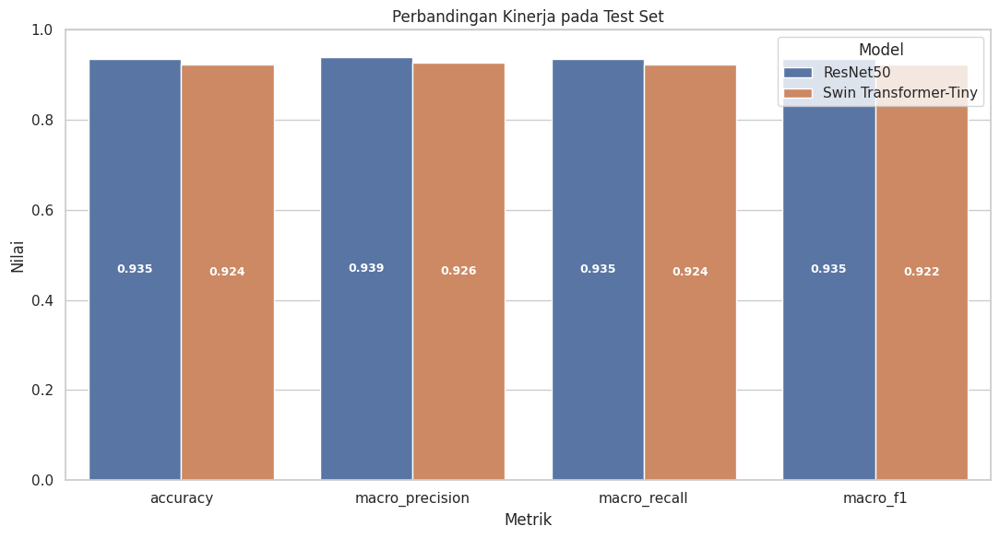

Tersimpan: /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures/03_test_metric_comparison.png


In [17]:
metric_plot_df = model_comparison_df.melt(
    id_vars="model",
    value_vars=[
        "accuracy",
        "macro_precision",
        "macro_recall",
        "macro_f1",
    ],
    var_name="metric",
    value_name="score",
)

plt.figure(figsize=(11, 6))
ax = sns.barplot(
    data=metric_plot_df,
    x="metric",
    y="score",
    hue="model",
)

# Add value labels inside the bars
for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.3f",          # Formats scores to 3 decimal places (e.g., 0.945)
        label_type="center",  # Places labels inside the middle of each bar
        color="white",        # Contrast color against dark bar backgrounds
        fontsize=9,
        weight="bold",
    )

ax.set_title("Perbandingan Kinerja pada Test Set")
ax.set_xlabel("Metrik")
ax.set_ylabel("Nilai")
ax.set_ylim(0, 1)
ax.legend(title="Model")
plt.tight_layout()

metric_comparison_figure = FIGURE_DIR / "03_test_metric_comparison.png"
plt.savefig(metric_comparison_figure, dpi=300, bbox_inches="tight")
plt.show()

print("Tersimpan:", metric_comparison_figure)

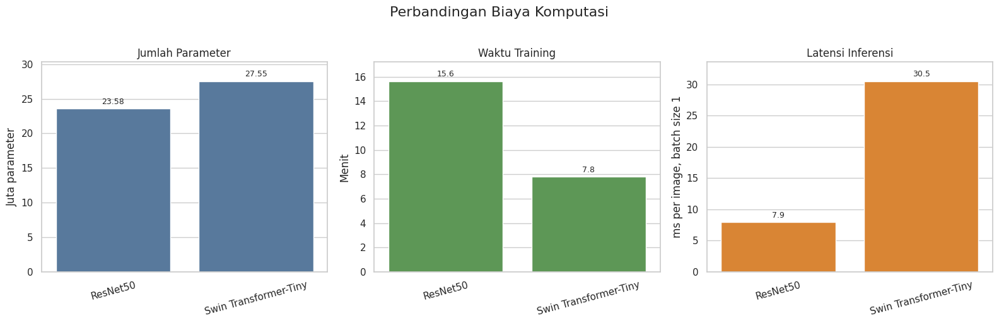

Tersimpan: /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures/03_computational_cost_comparison.png


In [19]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Plot 1: Jumlah Parameter
sns.barplot(
    data=model_comparison_df,
    x="model",
    y="parameters_million",
    ax=axes[0],
    color="#4C78A8",
)
axes[0].set_title("Jumlah Parameter")
axes[0].set_xlabel("")
axes[0].set_ylabel("Juta parameter")
axes[0].tick_params(axis="x", rotation=15)

# Add data labels to the first plot (Parameters)
for container in axes[0].containers:
    axes[0].bar_label(container, fmt='%.2f', padding=3, fontsize=9)

# Plot 2: Waktu Training
sns.barplot(
    data=model_comparison_df,
    x="model",
    y="training_time_minutes",
    ax=axes[1],
    color="#54A24B",
)
axes[1].set_title("Waktu Training")
axes[1].set_xlabel("")
axes[1].set_ylabel("Menit")
axes[1].tick_params(axis="x", rotation=15)

# Add data labels to the second plot (Training Time)
for container in axes[1].containers:
    axes[1].bar_label(container, fmt='%.1f', padding=3, fontsize=9)

# Plot 3: Latensi Inferensi
sns.barplot(
    data=model_comparison_df,
    x="model",
    y="inference_mean_ms_per_image",
    ax=axes[2],
    color="#F58518",
)
axes[2].set_title("Latensi Inferensi")
axes[2].set_xlabel("")
axes[2].set_ylabel("ms per image, batch size 1")
axes[2].tick_params(axis="x", rotation=15)

# Add data labels to the third plot (Latency)
for container in axes[2].containers:
    axes[2].bar_label(container, fmt='%.1f', padding=3, fontsize=9)

fig.suptitle("Perbandingan Biaya Komputasi", fontsize=16, y=1.02)
# Adding extra margin to prevent labels from being cut off
axes[0].margins(y=0.1)
axes[1].margins(y=0.1)
axes[2].margins(y=0.1)
plt.tight_layout()

cost_comparison_figure = FIGURE_DIR / "03_computational_cost_comparison.png"
plt.savefig(cost_comparison_figure, dpi=300, bbox_inches="tight")
plt.show()

print("Tersimpan:", cost_comparison_figure)

## 10. Confusion matrix

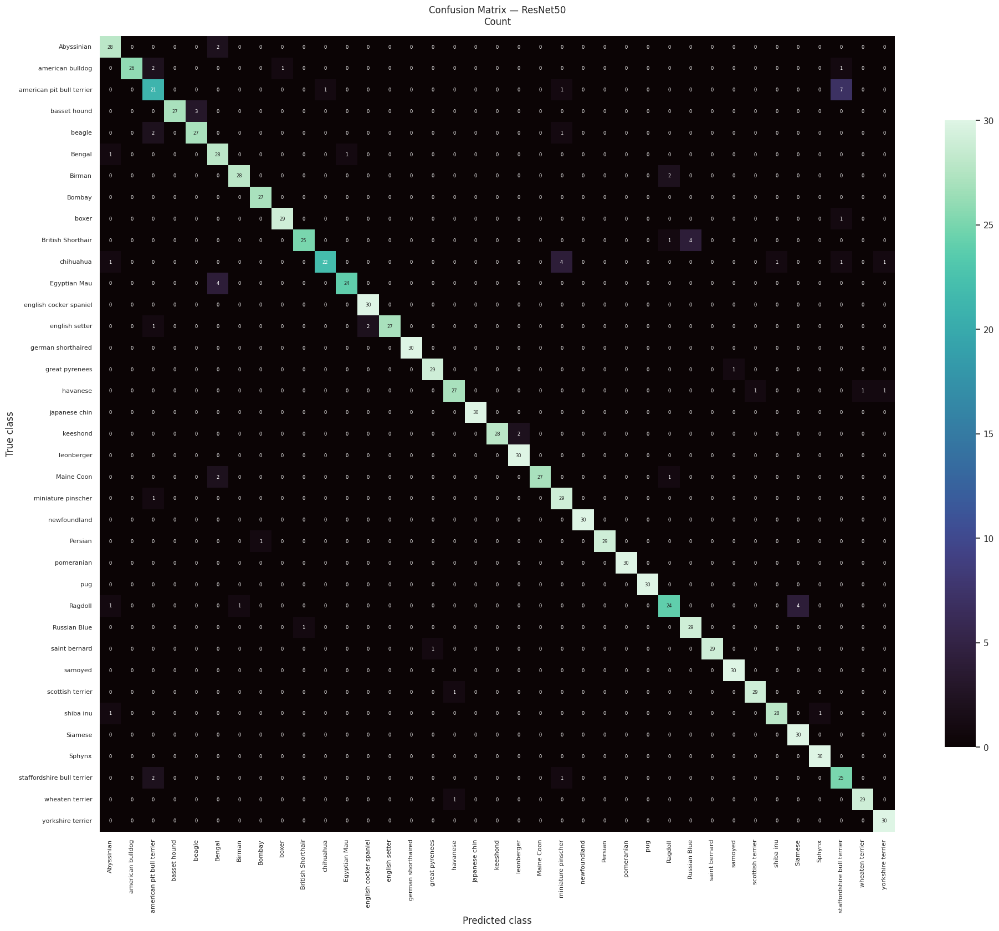

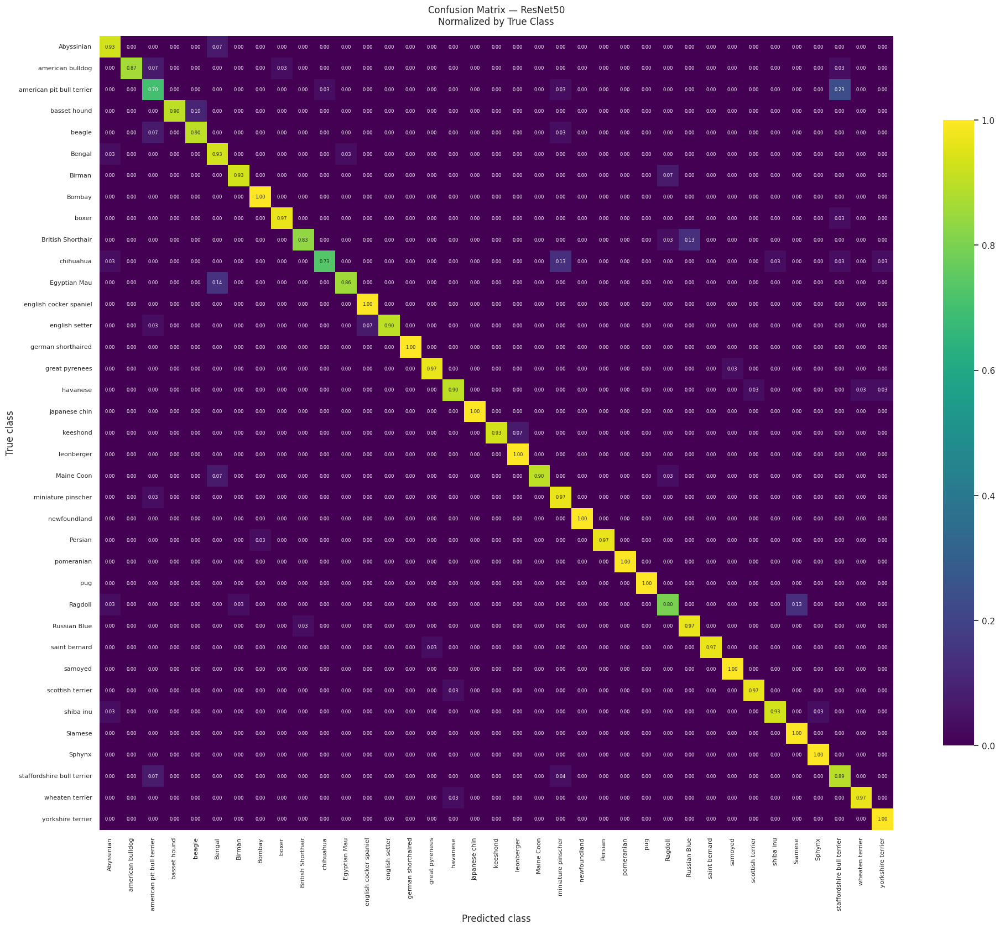

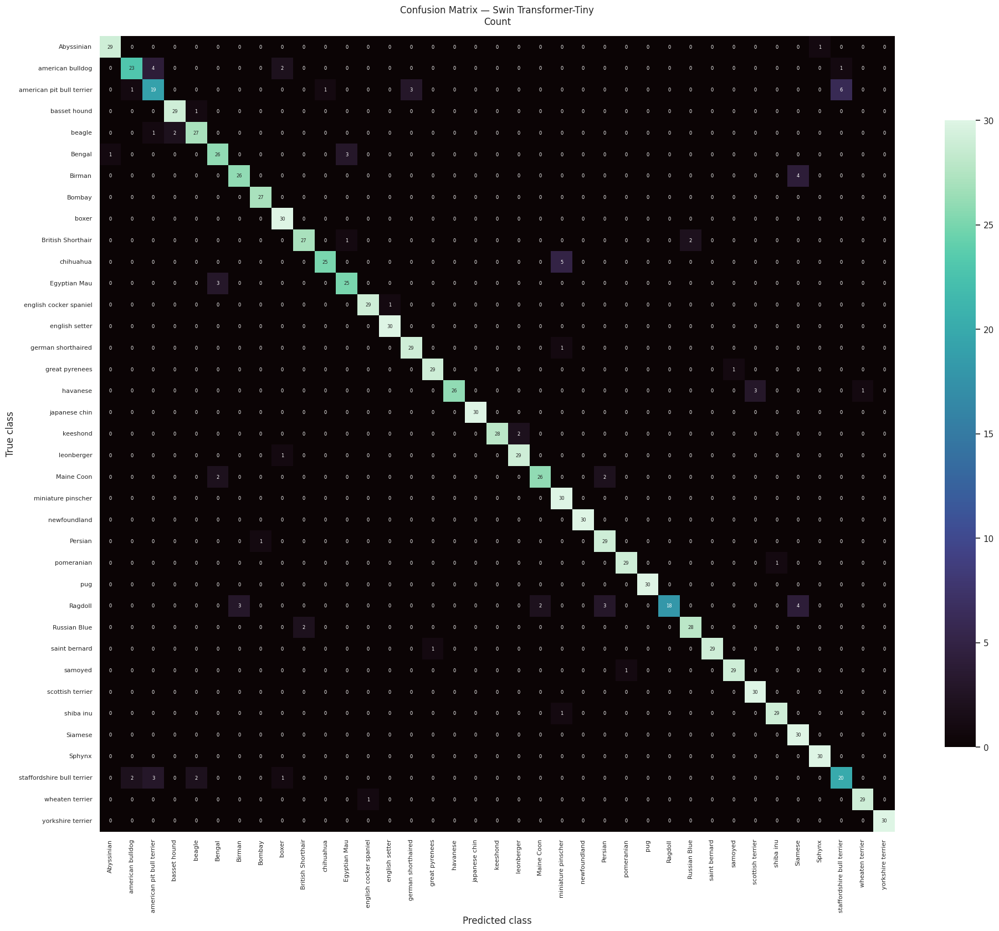

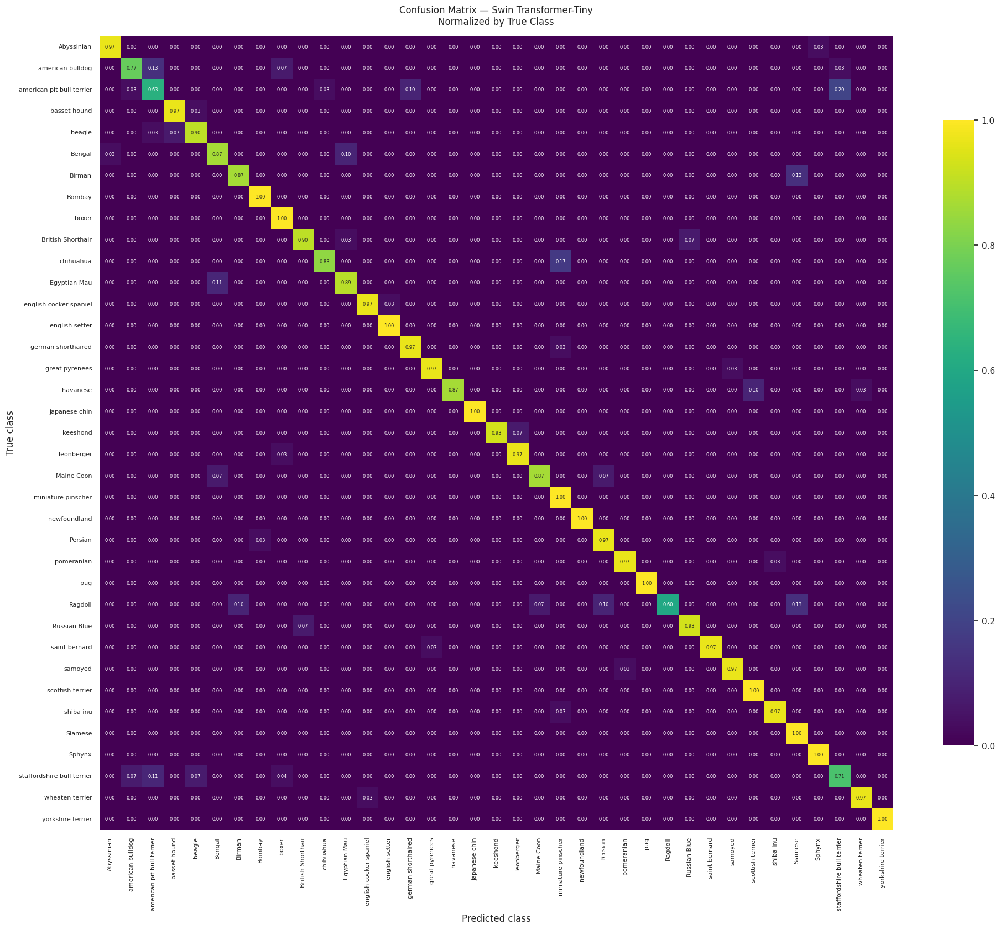

In [23]:
def plot_confusion_matrices(model_name, matrix):
    display_name = MODEL_DISPLAY_NAMES[model_name]
    row_totals = matrix.sum(axis=1, keepdims=True)
    normalized_matrix = np.divide(
        matrix,
        row_totals,
        out=np.zeros_like(matrix, dtype=float),
        where=row_totals != 0,
    )

    figure_paths = []
    plot_specs = [
        (matrix, "Count", "d", "mako", "count"),
        (
            normalized_matrix,
            "Normalized by True Class",
            ".2f",
            "viridis",
            "normalized",
        ),
    ]

    for matrix_to_plot, subtitle, value_format, color_map, suffix in plot_specs:
        plt.figure(figsize=(20, 17))
        sns.heatmap(
            matrix_to_plot,
            annot=True,  # Enables values inside each cell
            fmt=value_format,  # Uses 'd' for raw counts and '.2f' for normalized values
            annot_kws={
                "size": 6
            },  # Adjust font size so numbers fit comfortably inside 37x37 cells
            cmap=color_map,
            xticklabels=display_names,
            yticklabels=display_names,
            square=True,
            cbar_kws={"shrink": 0.75},
        )
        plt.title(f"Confusion Matrix — {display_name}\n{subtitle}", pad=15)
        plt.xlabel("Predicted class")
        plt.ylabel("True class")
        plt.xticks(rotation=90, fontsize=8)
        plt.yticks(rotation=0, fontsize=8)
        plt.tight_layout()

        output_path = (
            FIGURE_DIR / f"03_{model_name}_confusion_matrix_{suffix}.png"
        )
        plt.savefig(output_path, dpi=300, bbox_inches="tight")
        plt.show()
        figure_paths.append(output_path)

    return figure_paths


confusion_figure_paths = []
for model_name, matrix in confusion_matrices.items():
    confusion_figure_paths.extend(plot_confusion_matrices(model_name, matrix))

## 11. Ras yang paling sering tertukar

In [21]:
def create_confusion_pairs(model_name, matrix):
    rows = []
    true_totals = matrix.sum(axis=1)

    for true_idx in range(NUM_CLASSES):
        for predicted_idx in range(NUM_CLASSES):
            if true_idx == predicted_idx:
                continue

            count = int(matrix[true_idx, predicted_idx])
            if count == 0:
                continue

            rows.append(
                {
                    "model_key": model_name,
                    "model": MODEL_DISPLAY_NAMES[model_name],
                    "true_idx": true_idx,
                    "true_class": class_names[true_idx],
                    "predicted_idx": predicted_idx,
                    "predicted_class": class_names[predicted_idx],
                    "count": count,
                    "percentage_of_true_class": (
                        100 * count / true_totals[true_idx]
                    ),
                }
            )

    return (
        pd.DataFrame(rows)
        .sort_values(
            ["count", "percentage_of_true_class"],
            ascending=False,
        )
        .reset_index(drop=True)
    )


confusion_pair_tables = {}

for model_name, matrix in confusion_matrices.items():
    pair_df = create_confusion_pairs(model_name, matrix)
    confusion_pair_tables[model_name] = pair_df

    pair_path = METRIC_DIR / f"{model_name}_confusion_pairs.csv"
    pair_df.to_csv(pair_path, index=False)

    print("\n", MODEL_DISPLAY_NAMES[model_name])
    display(
        pair_df[
            [
                "true_class",
                "predicted_class",
                "count",
                "percentage_of_true_class",
            ]
        ]
        .head(15)
        .round(2)
    )


 ResNet50


,true_class,predicted_class,count,percentage_of_true_class
0,american_pit_bull_terrier,staffordshire_bull_terrier,7,23.33
1,Egyptian_Mau,Bengal,4,14.29
2,British_Shorthair,Russian_Blue,4,13.33
3,chihuahua,miniature_pinscher,4,13.33
4,Ragdoll,Siamese,4,13.33
5,basset_hound,beagle,3,10.00
6,staffordshire_bull_terrier,american_pit_bull_terrier,2,7.14
7,Abyssinian,Bengal,2,6.67
8,american_bulldog,american_pit_bull_terrier,2,6.67
9,beagle,american_pit_bull_terrier,2,6.67



 Swin Transformer-Tiny


,true_class,predicted_class,count,percentage_of_true_class
0,american_pit_bull_terrier,staffordshire_bull_terrier,6,20.00
1,chihuahua,miniature_pinscher,5,16.67
2,american_bulldog,american_pit_bull_terrier,4,13.33
3,Birman,Siamese,4,13.33
4,Ragdoll,Siamese,4,13.33
5,Egyptian_Mau,Bengal,3,10.71
6,staffordshire_bull_terrier,american_pit_bull_terrier,3,10.71
7,american_pit_bull_terrier,german_shorthaired,3,10.00
8,Bengal,Egyptian_Mau,3,10.00
9,havanese,scottish_terrier,3,10.00


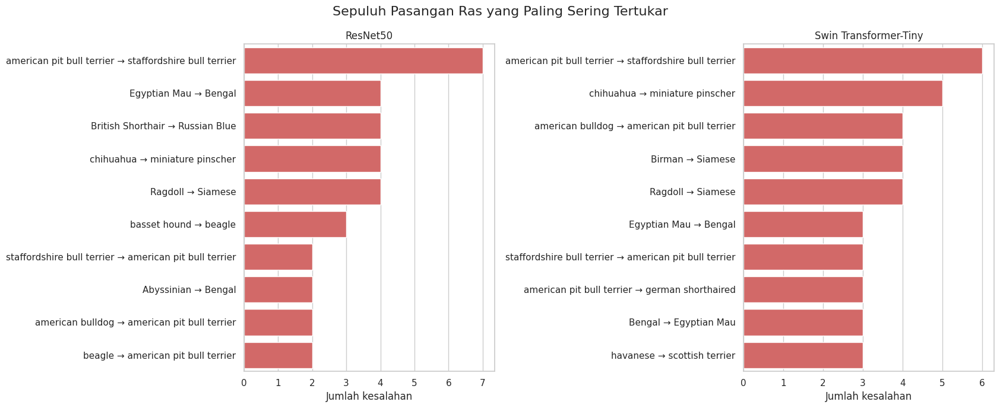

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(17, 7))

for axis, model_name in zip(axes, MODEL_DISPLAY_NAMES):
    top_pairs = confusion_pair_tables[model_name].head(10).copy()
    top_pairs["pair"] = (
        top_pairs["true_class"].str.replace("_", " ")
        + " → "
        + top_pairs["predicted_class"].str.replace("_", " ")
    )

    sns.barplot(
        data=top_pairs,
        x="count",
        y="pair",
        ax=axis,
        color="#E45756",
    )
    axis.set_title(MODEL_DISPLAY_NAMES[model_name])
    axis.set_xlabel("Jumlah kesalahan")
    axis.set_ylabel("")

fig.suptitle("Sepuluh Pasangan Ras yang Paling Sering Tertukar", fontsize=16)
plt.tight_layout()

confusion_pairs_figure = FIGURE_DIR / "03_most_frequent_confusions.png"
plt.savefig(confusion_pairs_figure, dpi=300, bbox_inches="tight")
plt.show()

## 12. Kinerja per kelas

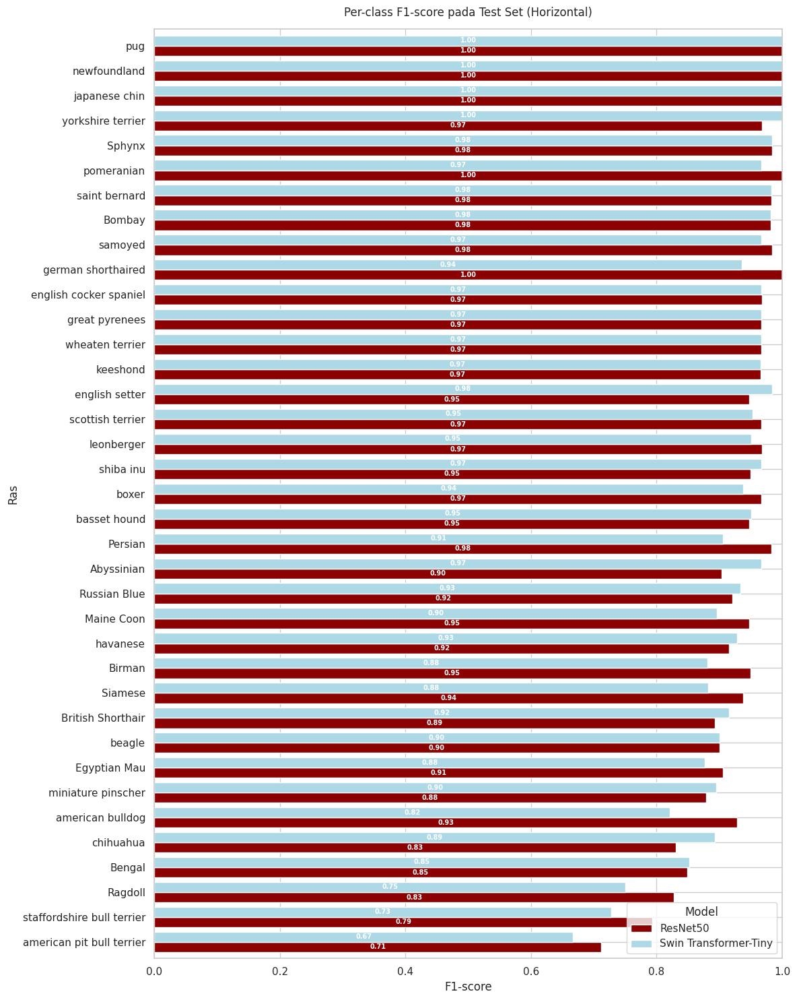

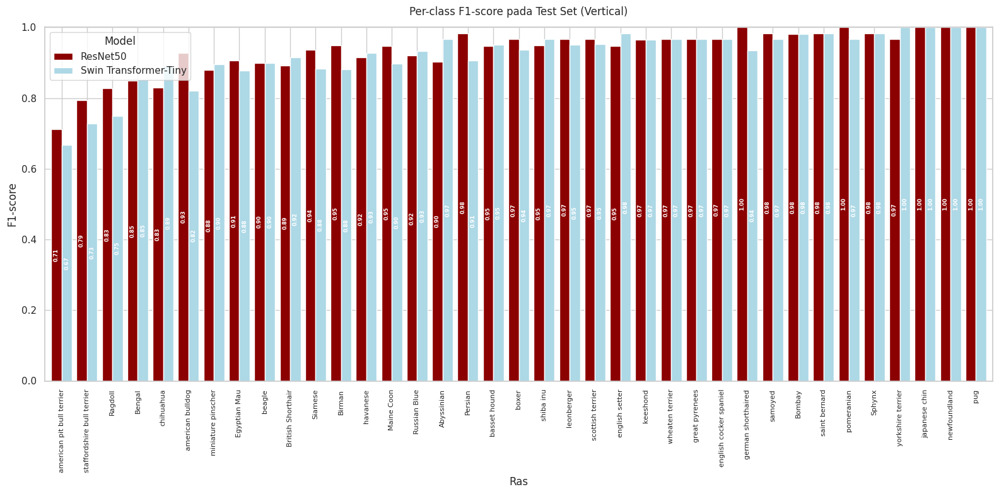

Tersimpan: /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures/03_per_class_f1_comparison_horizontal.png dan /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures/03_per_class_f1_comparison_vertical.png


In [26]:
import matplotlib.pyplot as plt
import pandas as pd

# Prepare data
all_per_class_df = pd.concat(
    list(per_class_tables.values()),
    ignore_index=True,
)
all_per_class_path = METRIC_DIR / "all_models_per_class_metrics.csv"
all_per_class_df.to_csv(all_per_class_path, index=False)

f1_wide_df = all_per_class_df.pivot(
    index="display_name",
    columns="model",
    values="f1_score",
)
f1_wide_df["mean_f1"] = f1_wide_df.mean(axis=1)
f1_wide_df = f1_wide_df.sort_values("mean_f1", ascending=True)

plot_columns = list(MODEL_DISPLAY_NAMES.values())

# ==========================================
# 1. HORIZONTAL BAR CHART (Inside Labels)
# ==========================================
fig1, ax1 = plt.subplots(figsize=(12, 15))

f1_wide_df[plot_columns].plot(
    kind="barh",
    width=0.82,
    #color=["#4C78A8", "#F58518"],
    color=["darkred", "lightblue"],
    ax=ax1,
)

# Place labels inside horizontal bars
for container in ax1.containers:
    ax1.bar_label(
        container,
        fmt="%.2f",
        label_type="center",
        color="white",
        fontsize=7,
        weight="bold",
    )

ax1.set_title("Per-class F1-score pada Test Set (Horizontal)", pad=14)
ax1.set_xlabel("F1-score")
ax1.set_ylabel("Ras")
ax1.set_xlim(0, 1)
ax1.legend(title="Model")
plt.tight_layout()

per_class_f1_figure_h = FIGURE_DIR / "03_per_class_f1_comparison_horizontal.png"
plt.savefig(per_class_f1_figure_h, dpi=300, bbox_inches="tight")
plt.show()


# ==========================================
# 2. VERTICAL BAR CHART (Inside Labels)
# ==========================================
fig2, ax2 = plt.subplots(figsize=(16, 8))

f1_wide_df[plot_columns].plot(
    kind="bar",
    width=0.82,
    color=["darkred", "lightblue"],
    ax=ax2,
)

# Place labels inside vertical bars (rotated 90 deg for narrow bars)
for container in ax2.containers:
    ax2.bar_label(
        container,
        fmt="%.2f",
        label_type="center",
        color="white",
        fontsize=6,
        weight="bold",
        rotation=90,
    )

ax2.set_title("Per-class F1-score pada Test Set (Vertical)", pad=14)
ax2.set_xlabel("Ras")
ax2.set_ylabel("F1-score")
ax2.set_ylim(0, 1)
ax2.tick_params(axis="x", rotation=90, labelsize=8)
ax2.legend(title="Model")
plt.tight_layout()

per_class_f1_figure_v = FIGURE_DIR / "03_per_class_f1_comparison_vertical.png"
plt.savefig(per_class_f1_figure_v, dpi=300, bbox_inches="tight")
plt.show()

print("Tersimpan:", per_class_f1_figure_h, "dan", per_class_f1_figure_v)

In [27]:
class_difference_df = f1_wide_df[plot_columns].copy()
class_difference_df["swin_minus_resnet_f1"] = (
    class_difference_df["Swin Transformer-Tiny"]
    - class_difference_df["ResNet50"]
)
class_difference_df = class_difference_df.sort_values(
    "swin_minus_resnet_f1",
    ascending=False,
)

class_difference_path = METRIC_DIR / "per_class_f1_difference.csv"
class_difference_df.to_csv(class_difference_path)

print("Kelas dengan peningkatan Swin-T terbesar dibanding ResNet50:")
display(class_difference_df.head(10).round(4))

print("Kelas dengan keunggulan ResNet50 terbesar dibanding Swin-T:")
display(class_difference_df.tail(10).sort_values("swin_minus_resnet_f1").round(4))

Kelas dengan peningkatan Swin-T terbesar dibanding ResNet50:


model,ResNet50,Swin Transformer-Tiny,swin_minus_resnet_f1
display_name,,,
Abyssinian,0.9032,0.9667,0.0634
chihuahua,0.8302,0.8929,0.0627
english setter,0.9474,0.9836,0.0362
yorkshire terrier,0.9677,1.0000,0.0323
British Shorthair,0.8929,0.9153,0.0224
shiba inu,0.9492,0.9667,0.0175
miniature pinscher,0.8788,0.8955,0.0167
havanese,0.9153,0.9286,0.0133
Russian Blue,0.9206,0.9333,0.0127


Kelas dengan keunggulan ResNet50 terbesar dibanding Swin-T:


model,ResNet50,Swin Transformer-Tiny,swin_minus_resnet_f1
display_name,,,
american bulldog,0.9286,0.8214,-0.1071
Ragdoll,0.8276,0.7500,-0.0776
Persian,0.9831,0.9062,-0.0768
Birman,0.9492,0.8814,-0.0678
staffordshire bull terrier,0.7937,0.7273,-0.0664
german shorthaired,1.0000,0.9355,-0.0645
Siamese,0.9375,0.8824,-0.0551
Maine Coon,0.9474,0.8966,-0.0508
american pit bull terrier,0.7119,0.6667,-0.0452


## 13. Contoh prediksi benar dan salah

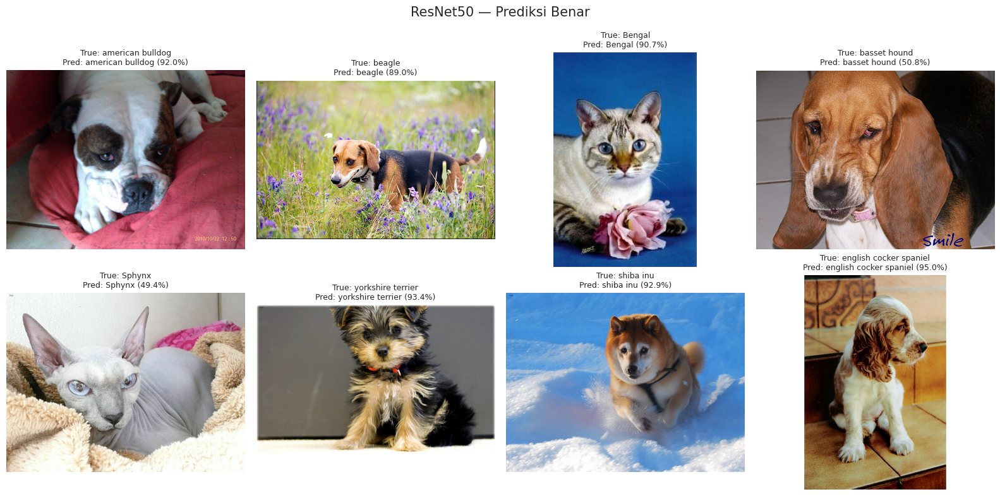

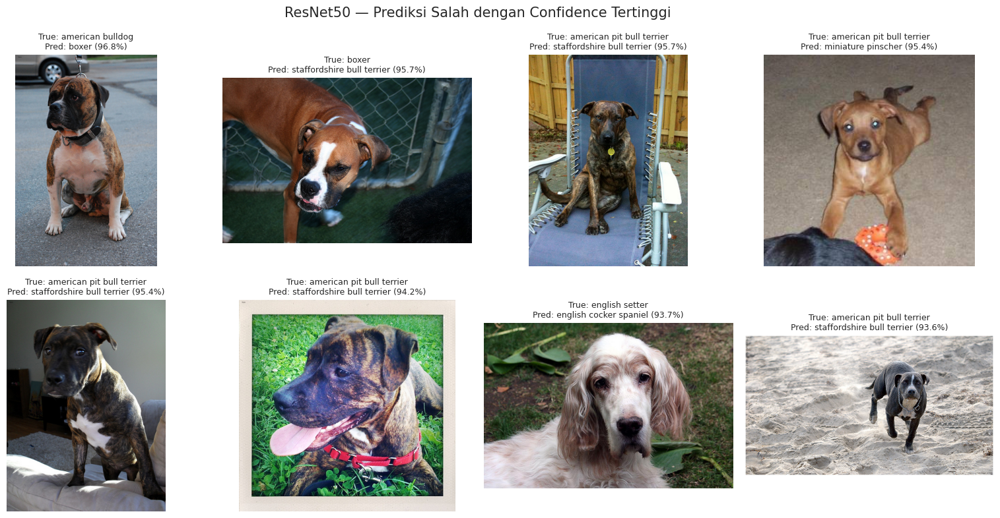

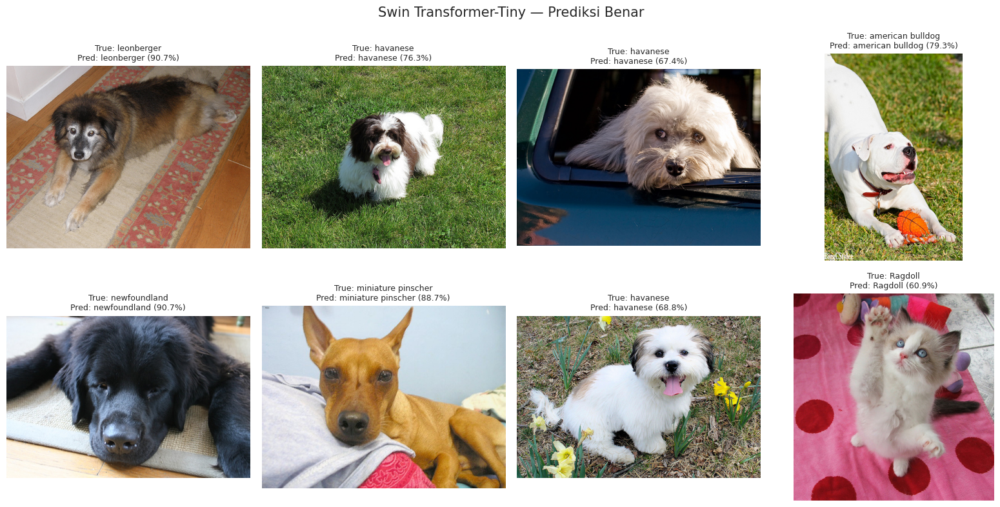

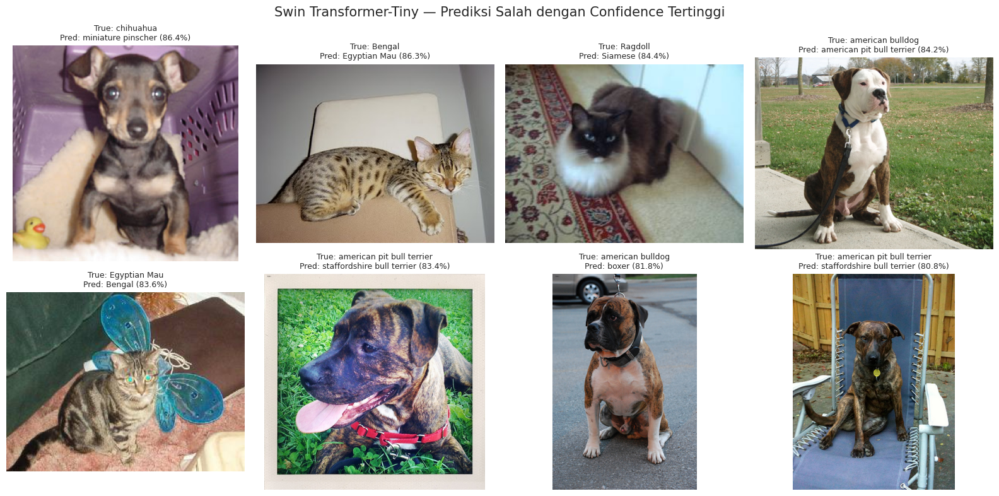

In [28]:
def plot_prediction_examples(
    model_name,
    prediction_df,
    show_correct,
    number_of_images=8,
):
    subset = prediction_df.loc[
        prediction_df["correct"] == show_correct
    ].copy()

    if show_correct:
        selected = subset.sample(
            n=min(number_of_images, len(subset)),
            random_state=SEED,
        )
        example_type = "correct"
        subtitle = "Prediksi Benar"
    else:
        selected = (
            subset.sort_values("confidence", ascending=False)
            .head(number_of_images)
        )
        example_type = "incorrect"
        subtitle = "Prediksi Salah dengan Confidence Tertinggi"

    rows = 2
    columns = 4
    fig, axes = plt.subplots(rows, columns, figsize=(16, 8))
    axes = axes.flatten()

    for axis, row in zip(axes, selected.itertuples(index=False)):
        image_path = LOCAL_IMAGES_DIR / row.file_name
        with Image.open(image_path) as image:
            image = ImageOps.exif_transpose(image).convert("RGB")
            axis.imshow(image)

        axis.set_title(
            f"True: {row.true_class.replace('_', ' ')}\n"
            f"Pred: {row.predicted_class.replace('_', ' ')} "
            f"({row.confidence:.1%})",
            fontsize=9,
        )
        axis.axis("off")

    for axis in axes[len(selected):]:
        axis.axis("off")

    fig.suptitle(
        f"{MODEL_DISPLAY_NAMES[model_name]} — {subtitle}",
        fontsize=15,
    )
    plt.tight_layout()

    output_path = (
        FIGURE_DIR / f"03_{model_name}_{example_type}_predictions.png"
    )
    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.show()

    return output_path


prediction_example_paths = []

for model_name, prediction_df in prediction_tables.items():
    prediction_example_paths.append(
        plot_prediction_examples(model_name, prediction_df, True)
    )
    prediction_example_paths.append(
        plot_prediction_examples(model_name, prediction_df, False)
    )

## 14. Analisis kesepakatan kedua model

,category,images,percentage
0,Both correct,986,89.39
1,Only ResNet50 correct,45,4.08
2,Only Swin-T correct,33,2.99
3,Both incorrect,39,3.54


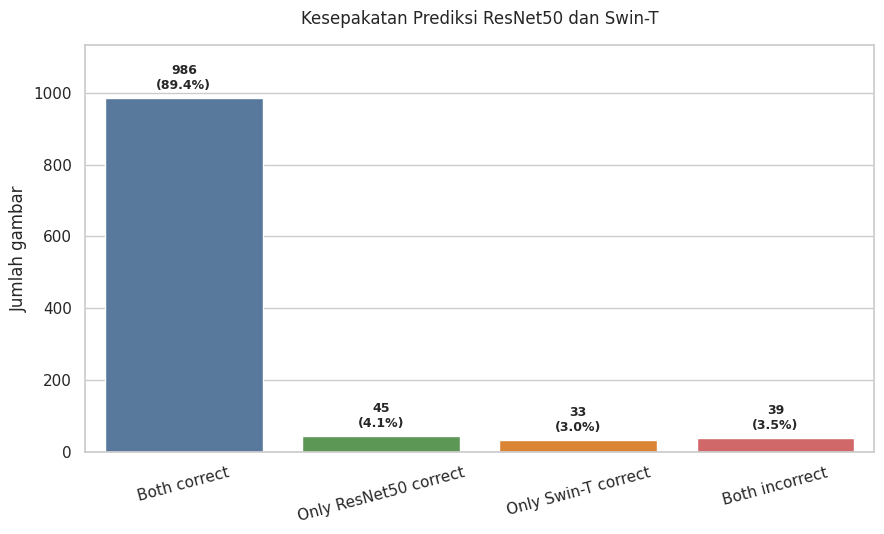

Tersimpan: /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures/03_model_prediction_agreement.png


In [30]:
resnet_predictions = prediction_tables["resnet50"][
    ["image_name", "true_idx", "predicted_idx", "correct"]
].rename(
    columns={
        "predicted_idx": "resnet_prediction",
        "correct": "resnet_correct",
    }
)

swin_predictions = prediction_tables["swin_t"][
    ["image_name", "predicted_idx", "correct"]
].rename(
    columns={
        "predicted_idx": "swin_prediction",
        "correct": "swin_correct",
    }
)

agreement_df = resnet_predictions.merge(
    swin_predictions,
    on="image_name",
    validate="one_to_one",
)

agreement_summary = pd.DataFrame(
    {
        "category": [
            "Both correct",
            "Only ResNet50 correct",
            "Only Swin-T correct",
            "Both incorrect",
        ],
        "images": [
            int((agreement_df["resnet_correct"] & agreement_df["swin_correct"]).sum()),
            int((agreement_df["resnet_correct"] & ~agreement_df["swin_correct"]).sum()),
            int((~agreement_df["resnet_correct"] & agreement_df["swin_correct"]).sum()),
            int((~agreement_df["resnet_correct"] & ~agreement_df["swin_correct"]).sum()),
        ],
    }
)
agreement_summary["percentage"] = (
    100 * agreement_summary["images"] / len(agreement_df)
)

agreement_summary_path = METRIC_DIR / "model_agreement_summary.csv"
agreement_summary.to_csv(agreement_summary_path, index=False)
display(agreement_summary.round(2))

# ==========================================
# BAR CHART WITH DISTINCT COLORS & LABELS
# ==========================================
plt.figure(figsize=(9, 5.5))

# Distinct palette for the 4 categories
category_colors = ["#4C78A8", "#54A24B", "#F58518", "#E15759"]

ax = sns.barplot(
    data=agreement_summary,
    x="category",
    y="images",
    hue="category",          # Color each bar distinctly by category
    palette=category_colors,
    legend=False,
)

# Add custom formatted labels above each bar (Count + Percentage)
for bar, count, pct in zip(
    ax.patches, agreement_summary["images"], agreement_summary["percentage"]
):
    ax.annotate(
        f"{count:,}\n({pct:.1f}%)",
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha="center",
        va="bottom",
        xytext=(0, 4),
        textcoords="offset points",
        fontsize=9,
        weight="bold",
    )

ax.set_title("Kesepakatan Prediksi ResNet50 dan Swin-T", pad=15)
ax.set_xlabel("")
ax.set_ylabel("Jumlah gambar")
ax.tick_params(axis="x", rotation=15)

# Expand top margin so labels don't get clipped
ax.margins(y=0.15)

plt.tight_layout()

agreement_figure = FIGURE_DIR / "03_model_prediction_agreement.png"
plt.savefig(agreement_figure, dpi=300, bbox_inches="tight")
plt.show()

print("Tersimpan:", agreement_figure)

## 15. Grad-CAM

Grad-CAM dihitung pada feature stage terakhir:

- ResNet50: blok terakhir `layer4[-1]`, berformat BCHW.
- Swin-T: stage terakhir `features[-1]`, berformat BHWC.

Visualisasi memperlihatkan area yang paling berkontribusi terhadap kelas yang
diprediksi model. Grad-CAM pada Transformer merupakan gradient-based feature
localisation, bukan visualisasi bobot self-attention mentah.

In [31]:
def generate_gradcam(
    model,
    image_tensor,
    target_layer,
    feature_layout,
    target_class=None,
):
    captured = {}

    def forward_hook(module, inputs, output):
        captured["activation"] = output

        def save_gradient(gradient):
            captured["gradient"] = gradient

        output.register_hook(save_gradient)

    hook_handle = target_layer.register_forward_hook(forward_hook)

    try:
        model.zero_grad(set_to_none=True)
        logits = model(image_tensor)

        if target_class is None:
            target_class = int(logits.argmax(dim=1).item())

        score = logits[0, target_class]
        score.backward()
    finally:
        hook_handle.remove()

    activation = captured["activation"].detach()
    gradient = captured["gradient"].detach()

    if feature_layout == "BHWC":
        activation = activation.permute(0, 3, 1, 2)
        gradient = gradient.permute(0, 3, 1, 2)
    elif feature_layout != "BCHW":
        raise ValueError(f"Feature layout tidak didukung: {feature_layout}")

    channel_weights = gradient.mean(dim=(2, 3), keepdim=True)
    cam = (channel_weights * activation).sum(dim=1, keepdim=True)
    cam = torch.relu(cam)
    cam = F.interpolate(
        cam,
        size=(IMAGE_SIZE, IMAGE_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    cam = cam[0, 0]
    cam = cam - cam.min()
    cam = cam / cam.max().clamp_min(1e-8)

    return cam.cpu().numpy(), target_class

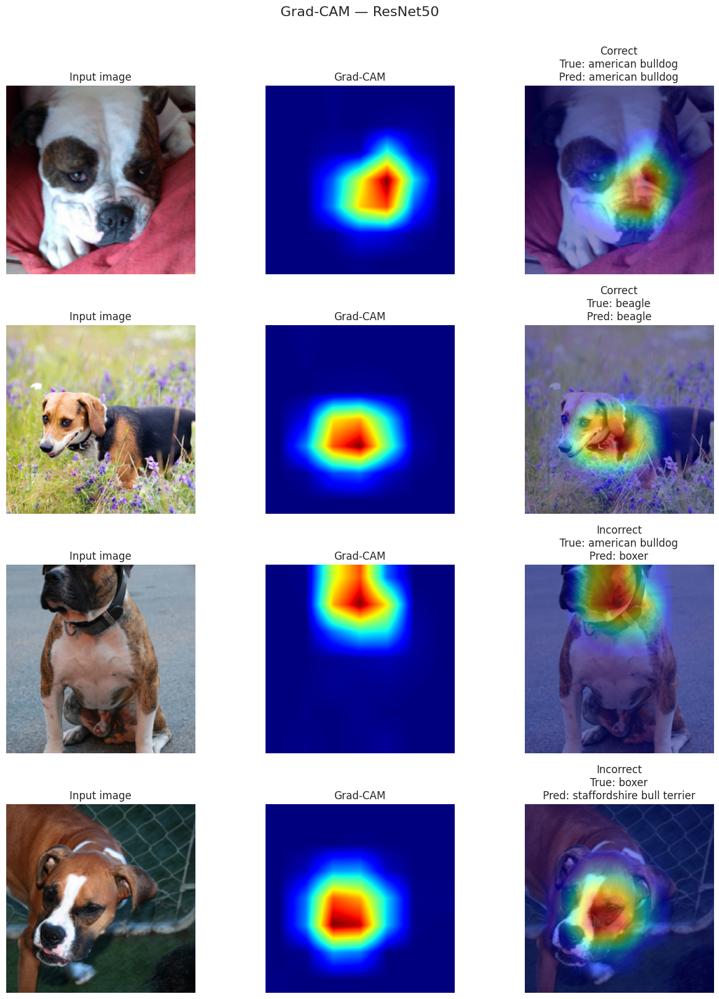

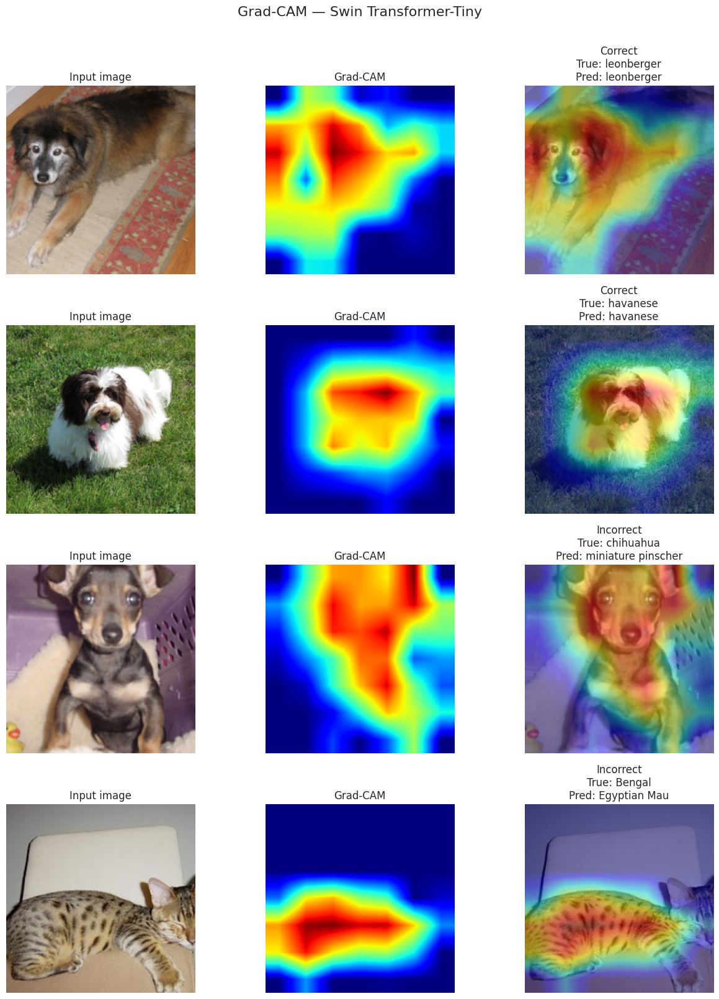

In [32]:
def select_gradcam_examples(prediction_df, correct_count=2, incorrect_count=2):
    correct_examples = prediction_df.loc[prediction_df["correct"]].sample(
        n=min(correct_count, int(prediction_df["correct"].sum())),
        random_state=SEED,
    )
    incorrect_examples = (
        prediction_df.loc[~prediction_df["correct"]]
        .sort_values("confidence", ascending=False)
        .head(incorrect_count)
    )
    return pd.concat(
        [correct_examples, incorrect_examples],
        ignore_index=True,
    )


def plot_gradcam_examples(model_name, prediction_df):
    model, _ = load_best_model(model_name)
    model.eval()

    if model_name == "resnet50":
        target_layer = model.layer4[-1]
        feature_layout = "BCHW"
    else:
        target_layer = model.features[-1]
        feature_layout = "BHWC"

    selected = select_gradcam_examples(prediction_df)
    figure_rows = len(selected)
    fig, axes = plt.subplots(
        figure_rows,
        3,
        figsize=(13, 4 * figure_rows),
        squeeze=False,
    )

    for row_number, row in enumerate(selected.itertuples(index=False)):
        image_path = LOCAL_IMAGES_DIR / row.file_name

        with Image.open(image_path) as image:
            original_image = ImageOps.exif_transpose(image).convert("RGB")
            display_image = display_transform(original_image)
            normalized_tensor = eval_transform(original_image)

        image_tensor = normalized_tensor.unsqueeze(0).to(device)
        cam, predicted_class = generate_gradcam(
            model,
            image_tensor,
            target_layer,
            feature_layout,
            target_class=int(row.predicted_idx),
        )

        display_array = np.asarray(display_image).astype(np.float32) / 255.0
        heatmap = plt.get_cmap("jet")(cam)[..., :3]
        overlay = np.clip(0.55 * display_array + 0.45 * heatmap, 0, 1)

        axes[row_number, 0].imshow(display_array)
        axes[row_number, 0].set_title("Input image")

        axes[row_number, 1].imshow(cam, cmap="jet", vmin=0, vmax=1)
        axes[row_number, 1].set_title("Grad-CAM")

        axes[row_number, 2].imshow(overlay)
        correctness = "Correct" if row.correct else "Incorrect"
        axes[row_number, 2].set_title(
            f"{correctness}\n"
            f"True: {row.true_class.replace('_', ' ')}\n"
            f"Pred: {row.predicted_class.replace('_', ' ')}"
        )

        for column in range(3):
            axes[row_number, column].axis("off")

        del image_tensor

    fig.suptitle(
        f"Grad-CAM — {MODEL_DISPLAY_NAMES[model_name]}",
        fontsize=16,
        y=1.005,
    )
    plt.tight_layout()

    output_path = FIGURE_DIR / f"03_{model_name}_gradcam.png"
    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.show()

    del model
    gc.collect()
    torch.cuda.empty_cache()

    return output_path


gradcam_paths = []
for model_name, prediction_df in prediction_tables.items():
    gradcam_paths.append(
        plot_gradcam_examples(model_name, prediction_df)
    )

## 16. Menyimpan ringkasan hasil dalam JSON

In [33]:
final_results = {
    "dataset": {
        "name": "Oxford-IIIT Pet",
        "task": "37-class pet breed classification",
        "test_images": int(len(test_df)),
        "number_of_classes": NUM_CLASSES,
        "split": "custom stratified 70/15/15, random seed 42",
    },
    "environment": ENVIRONMENT,
    "latency_protocol": {
        "batch_size": 1,
        "warmup_runs": 20,
        "timed_images": 200,
        "includes_image_loading": False,
        "includes_preprocessing": False,
        "mixed_precision": AMP_ENABLED,
    },
    "models": {
        row["model_key"]: {
            key: (
                value.item()
                if isinstance(value, np.generic)
                else value
            )
            for key, value in row.items()
            if key != "model_key"
        }
        for row in evaluation_metrics
    },
}

final_results_json_path = METRIC_DIR / "final_evaluation_results.json"
with final_results_json_path.open("w", encoding="utf-8") as file_obj:
    json.dump(final_results, file_obj, indent=2, ensure_ascii=False)

print("Tersimpan:", final_results_json_path)

Tersimpan: /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics/final_evaluation_results.json


## 17. Verifikasi output akhir

In [34]:
expected_outputs = [
    environment_path,
    model_comparison_path,
    final_results_json_path,
    all_per_class_path,
    class_difference_path,
    agreement_summary_path,
    metric_comparison_figure,
    cost_comparison_figure,
    confusion_pairs_figure,
    per_class_f1_figure,
    agreement_figure,
    *confusion_figure_paths,
    *prediction_example_paths,
    *gradcam_paths,
]

for model_name in MODEL_DISPLAY_NAMES:
    expected_outputs.extend(
        [
            PREDICTION_DIR / f"{model_name}_test_predictions.csv",
            METRIC_DIR / f"{model_name}_per_class_metrics.csv",
            METRIC_DIR / f"{model_name}_confusion_pairs.csv",
        ]
    )

output_check = pd.DataFrame(
    [
        {
            "file": path.name,
            "folder": str(path.parent),
            "exists": path.exists(),
            "size_mb": (
                round(path.stat().st_size / 1024**2, 3)
                if path.exists()
                else np.nan
            ),
        }
        for path in expected_outputs
    ]
)

display(output_check)
assert output_check["exists"].all(), "Ada output evaluasi yang belum tersedia."

print("=" * 72)
print("NOTEBOOK 03 SELESAI")
print("=" * 72)
print("Test images       :", len(test_df))
print("Number of classes :", NUM_CLASSES)
print("Metrics folder    :", METRIC_DIR)
print("Prediction folder :", PREDICTION_DIR)
print("Figure folder     :", FIGURE_DIR)

,file,folder,exists,size_mb
0,evaluation_environment.json,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics,True,0.000
1,final_model_comparison.csv,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics,True,0.001
2,final_evaluation_results.json,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics,True,0.003
3,all_models_per_class_metrics.csv,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics,True,0.007
4,per_class_f1_difference.csv,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics,True,0.002
5,model_agreement_summary.csv,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics,True,0.000
6,03_test_metric_comparison.png,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures,True,0.110
7,03_computational_cost_comparison.png,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures,True,0.189
8,03_most_frequent_confusions.png,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures,True,0.307
9,03_per_class_f1_comparison.png,/content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures,True,0.362


NOTEBOOK 03 SELESAI
Test images       : 1103
Number of classes : 37
Metrics folder    : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/metrics
Prediction folder : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/predictions
Figure folder     : /content/drive/MyDrive/Binus/Sem2Per1_DeepLearningandItsApplication/AoL1_ComputerVision/outputs/figures
